# Plotting vector data with GeoPandas and Matplotlib

Data used: Boundary-Line™ (<https://osdatahub.os.uk/downloads/open/BoundaryLine>)

In [1]:
# change directory to root if using JupyterLab
import os
os.chdir("..")

In [1]:
# import libraries
import geopandas as gpd
import matplotlib.pyplot as plt

In [2]:
# configure plot styles
plt.style.use("Solarize_Light2")
plt.rcParams["font.family"] = "Source Sans Pro"
plt.rcParams["figure.dpi"] = 96
plt.rcParams["axes.grid"] = False
plt.rcParams["text.color"] = "darkslategrey"
plt.rcParams["axes.labelcolor"] = "darkslategrey"
plt.rcParams["xtick.labelcolor"] = "darkslategrey"
plt.rcParams["ytick.labelcolor"] = "darkslategrey"
plt.rcParams["axes.titlesize"] = "12"
plt.rcParams["axes.labelsize"] = "10"
plt.rcParams["axes.titleweight"] = "semibold"

In [3]:
# import data
data = gpd.read_file(
    "data/os_bdline/data/bdline_gb.gpkg", layer="greater_london_const"
)
data["Name"] = data["Name"].str.slice(stop=-18)

In [4]:
# view data
data.head(5)

,Name,Area_Code,Area_Description,File_Name,Feature_Serial_Number,Collection_Serial_Number,Global_Polygon_ID,Admin_Unit_ID,Census_Code,Hectares,Non_Inland_Area,Area_Type_Code,Area_Type_Description,Non_Area_Type_Code,Non_Area_Type_Description,geometry
0,Havering and Redbridge,LAC,Greater London Authority Assembly Constituency,GREATER_LONDON_AUTHORITY,1,1,112074,41452,E32000009,17089.120,215.025,VA,CIVIL VOTING AREA,None,None,"MULTIPOLYGON (((552057.328 178434.366, 552047...."
1,Croydon and Sutton,LAC,Greater London Authority Assembly Constituency,GREATER_LONDON_AUTHORITY,2,2,112056,41443,E32000005,13033.641,0.000,VA,CIVIL VOTING AREA,None,None,"MULTIPOLYGON (((531409.308 171042.621, 531439...."
2,Bexley and Bromley,LAC,Greater London Authority Assembly Constituency,GREATER_LONDON_AUTHORITY,3,3,112066,41448,E32000002,21444.820,373.731,VA,CIVIL VOTING AREA,None,None,"MULTIPOLYGON (((549944.025 181074.392, 549992...."
3,South West,LAC,Greater London Authority Assembly Constituency,GREATER_LONDON_AUTHORITY,4,4,112076,41453,E32000013,15259.573,198.064,VA,CIVIL VOTING AREA,None,None,"MULTIPOLYGON (((519458.306 179569.530, 519465...."
4,Ealing and Hillingdon,LAC,Greater London Authority Assembly Constituency,GREATER_LONDON_AUTHORITY,5,5,112054,41442,E32000006,17124.643,0.000,VA,CIVIL VOTING AREA,None,None,"MULTIPOLYGON (((504288.900 193543.098, 504292...."


## Categorical

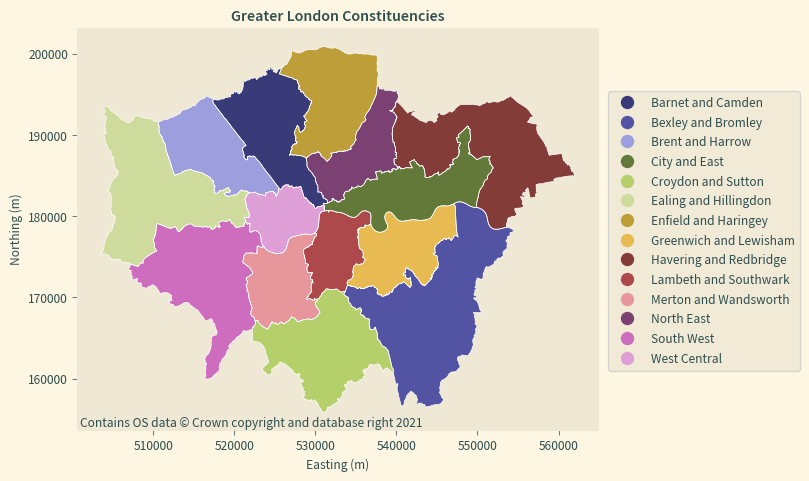

In [5]:
# categorical map
base = data.plot(
    cmap="tab20b",
    figsize=(7, 7),
    legend=True,
    column="Name",
    legend_kwds={"loc": "upper right", "bbox_to_anchor": (1.4, .86)}
)

data.boundary.plot(color="white", ax=base, linewidth=.5)

plt.title("Greater London Constituencies")
plt.text(
    501000,
    154000,
    "Contains OS data © Crown copyright and database right 2021"
)
plt.xlabel("Easting (m)")
plt.ylabel("Northing (m)")
base.set_aspect("equal", "box")

plt.show()

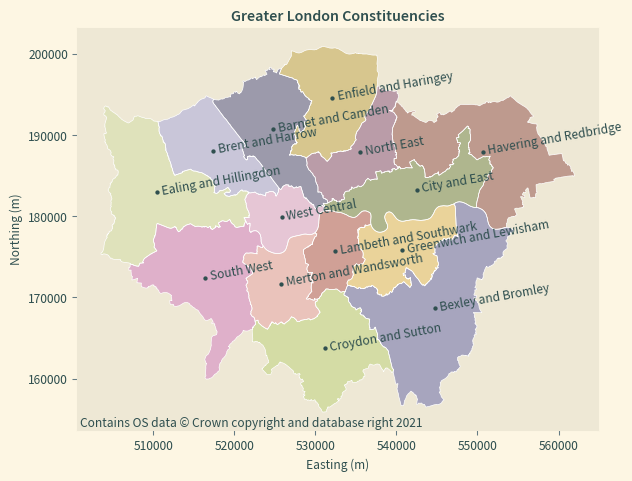

In [6]:
# categorical map - labels directly on plot
base = data.plot(cmap="tab20b", figsize=(7, 7), column="Name", alpha=.45)

data.boundary.plot(color="white", ax=base, linewidth=.5)

data.centroid.plot(ax=base, color="darkslategrey", markersize=5)

map_labels = zip(zip(data.centroid.x+500, data.centroid.y-300), data["Name"])
for xy, lab in map_labels:
    base.annotate(text=lab, xy=xy, textcoords="data", rotation=10)

plt.title("Greater London Constituencies")
plt.text(
    501000,
    154000,
    "Contains OS data © Crown copyright and database right 2021"
)
plt.xlabel("Easting (m)")
plt.ylabel("Northing (m)")
base.set_aspect("equal", "box")

plt.show()

## Choropleth

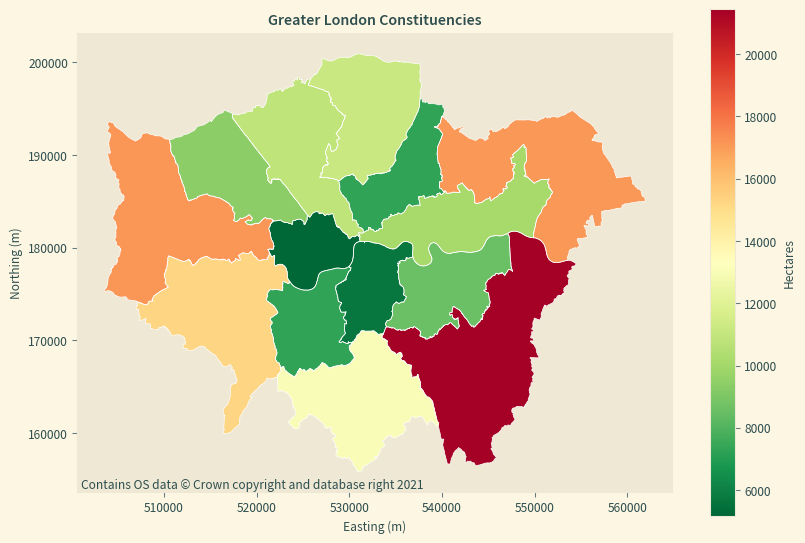

In [9]:
# choropleth map - continuous symbology
base = data.plot(
    column="Hectares",
    legend=True,
    cmap="RdYlGn_r",
    figsize=(10, 7),
    legend_kwds={"label": "Hectares"}
)

data.boundary.plot(color="white", ax=base, linewidth=.5)

plt.title("Greater London Constituencies")
plt.text(
    501000,
    154000,
    "Contains OS data © Crown copyright and database right 2021"
)
plt.xlabel("Easting (m)")
plt.ylabel("Northing (m)")
base.set_aspect("equal", "box")

plt.show()

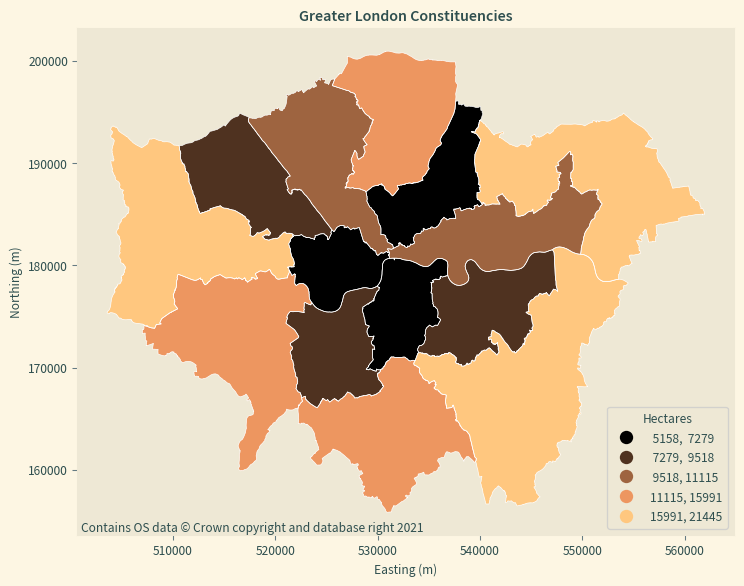

In [10]:
# choropleth map - discrete symbology
base = data.plot(
    column="Hectares",
    legend=True,
    cmap="copper",
    scheme="QUANTILES",
    figsize=(10, 7),
    legend_kwds={"title": "Hectares", "loc": "lower right", "fmt": "{:.0f}"}
)

data.boundary.plot(color="white", ax=base, linewidth=.5)

plt.title("Greater London Constituencies")
plt.text(
    501000,
    154000,
    "Contains OS data © Crown copyright and database right 2021"
)
plt.xlabel("Easting (m)")
plt.ylabel("Northing (m)")
base.set_aspect("equal", "box")

plt.show()